# Homework 4

> Giorgio Zannini Quirini <br>
> Davide Manfredini <br>
> Yousef Abbar

## 1) Does basic house information reflect house's description?

This is a list of libraries we are going to use throughout our analysis.

In [2]:
import requests
from bs4 import BeautifulSoup as soup
import pandas as pd
import nltk 
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.tokenize import sent_tokenize, word_tokenize
import math
from sklearn.cluster import KMeans
import numpy as np
import scipy.stats
from tqdm import tqdm
import time
from wordcloud import WordCloud
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from PIL import Image, ImageDraw

We now start with the web scraping on the site Immobiliare.it. Our goal is to have all we need for the construction of the information matrix and the description matrix: 
<br>
- the $vocabulary$ contains the words and their respective id: $\{word : word_{id} , \cdots\}$
- $info\_dic$ maps to every announcement title, the features of the offer: $\{announcement\_title\_i: [price, locali, superficie, bagni, piano]\}$
- $desc\_dic$ has for every announcement id their tokenized description: $\{announcement_{i}: ["word_1","word_2",\cdots]\}$
- In $inverted\_index$ every word id is paired with the list of announcements that contain the word: $\{word_{id}: ["ann_1", "ann_2", \cdots]\}$ <br>

For the actual scraping, we search for the divisor that encloses the fields we are interested in: the price of the house, the rooms number, the surface in squared meteres, the number of bathrooms, the floor and the description. For the complete description we have to find the url of the announcement page, access it, and extracting the text. With a $try$ and $except$ construct we leave out all the announcements that do not have all the required attributes.

In [2]:
vocabulary = {} # {casa: 0, giardino:1,...}
info_dic = {} # {'bilocale a pigneto': [price, locali, superficie, bagni, piano] ,...}
desc_dic = {} # {'ann_1': ['casa','giardino'....], 'ann_2': ['tetto', 'bagno'....], ...}
inverted_index = {}# {0(word_id): ['ann_1', 'ann_2',...], 1: ['ann_50','ann_897'...],...}
j=0 # for thw word id
ann_idx=1 # for the announcement id
for i in tqdm(range(1,800)): # tqdm for the progress bar
    my_url = 'https://www.immobiliare.it/vendita-case/roma/?criterio=rilevanza&pag={}'.format(str(i)) #iterating over the url
    uClient = requests.get(my_url) # requesting from the page
    page_html = uClient.text # transforming to text to work on it
    page_soup = soup(page_html, "html.parser") # parsing the html format
    Containers  = page_soup.findAll("div",{"class":"listing-item_body"}) # finding the announcement 'boxes' with all the info
    
    for container in Containers: # iterating over the anouncements
        try: # discarding the announcements that don't have all the required fields
            Announcement = container.div.a["title"] # title

            price_container = container.findAll("li", {"class":"lif__item lif__pricing"}) # 'box' that has the price
            price = price_container[-1].text.strip() # extracting price
        
            loc_sup_bag_container = container.findAll("span", {"class":"text-bold"}) # 'box' that has locali,superficie,bagni
            locali = loc_sup_bag_container[-3].text # .text is to read the html line without the divisors
            superficie = loc_sup_bag_container[-2].text
            bagni = loc_sup_bag_container[-1].text
            
            piano = container.div.abbr["title"] # extracting floor number
            
            url = container.find('a')['href'] # finding the url of the announcement page that has full description
            link = requests.get(url) # requesting
            ann_page = soup(link.text,'html.parser')  # parsing the html of the annoucnement page
            
            desc = ann_page.find('div',{'role':'contentinfo'}).text.strip() # finding the description
            tokenize = nltk.word_tokenize(desc) # tokenizing
            filtered_words = [word for word in tokenize if word not in nltk.corpus.stopwords.words('italian') 
                            and word not in ".,'()"]
            # removing stopwords, removing punctuation
            for w in filtered_words: # creating vocabulary
                if w not in vocabulary: # creating a new key if already not in there
                    vocabulary[w]=j # assigning word id
                    j+=1 # updating the counter
                if vocabulary[w] not in inverted_index: # creating inverted index
                    inverted_index[vocabulary[w]]=['Ann_'+str(ann_idx)] #{word id from the voc: [list of announcements it is in]}
                else:
                    inverted_index[vocabulary[w]].append('Ann_'+str(ann_idx))
                    
            info_dic[Announcement] = price, locali, superficie, bagni, piano # list with the features for info_dic
            desc_dic["ann_{}".format(ann_idx)] = filtered_words # creating key with announcement and tokenized description
            ann_idx += 1 # updating annoucnemtns id
        except:
            pass
    time.sleep(1)

100%|██████████████████████████████████████████████████████████████████████████████| 799/799 [3:49:42<00:00,  5.41s/it]


For the clustering, we removed the words with the least amount of occurrances, since they are not of any use. With this change we aim to improve on the computational time of the $tf/idf$ score for the description matrix and of the clustering.

In [65]:
for_del = list(inverted_index.keys()) #cleaning too common words 
for key in for_del:
    if len(inverted_index[key]) < 20: 
        del inverted_index[key]

Further cleaning: we delete the keys that are not words (e.g. phone numbers) from both the vocabulary and the inverted index.

In [66]:
to_del = list(vocabulary.keys()) 
for key in to_del: # for key in the vocabulary keys...
    if key.isalpha() == False: # deleting what is not strictly alphabetic
        del inverted_index[vocabulary[key]] # from the inv_idx
        del vocabulary[key] # and from the voc
    elif vocabulary[key] not in inverted_index.keys(): # if the word id is not in the inverted index
        del vocabulary[key] # remove it from the vocabulary

These are the defined functions to compute the tf/idf of the words:
 $$ tf\_idf_{i,j} = tf_{i,j} \times idf_{i}$$ <br>
 where $tf_{i,j}$ is the term frequency of the word i in document j (how many times the word is repeated in the document), and $idf_{i}$ is a measure of the rarity of the word in the whole set of documents.

In [69]:
# how many times the word is repeated within the document
def tf(word, word_list):
    return word_list.count(word) / len(word_list)

# how many document contain at least once the word
def document_frequency(word):
    return len(inverted_index[vocabulary[word]])

# 'rarity' of the word
def idf(word):
    return math.log(len(info_dic.keys()) / document_frequency(word))

# final score
def tfidf(word, word_list):
    return tf(word, word_list) * idf(word)

Here we create a dictionary with all the scores of the single words and the documents it appears in. It will resemble this form: $\{word_i : [(ann_{k}, tf/idf_{i,k}), \cdots], \cdots\}$

In [70]:
scores = {} # creating dictionary with tf/idfs
for ann,word_list in desc_dic.items(): # iterating over keys and values of desc_dic = {ann_id: description}
    for w in word_list:# for every word in the various descriptions
        if w in vocabulary:
            score = tfidf(w,word_list) # applying function
            w_index = (ann,score) # tuple with ann_id and tfidf
            if vocabulary[w] not in scores: # if there is no key in the score with that id...
                temp = [] # create a new list
                temp.append(w_index) # append the tuple
                scores[vocabulary[w]] = temp # put the new value and key in
            elif ann not in scores[vocabulary[w]]: # if its in there already... 
                scores[vocabulary[w]].append(w_index) # just append new value

For repeated use of the dictionaries we created and to not run the lengthy code again, we save the files locally.

In [76]:
to_save = [vocabulary, info_dic, desc_dic, inverted_index,scores] # saving files
names = ['voc','info','desc','inv_idx','scores']
for i, document in enumerate(to_save):
    file = open('{}.txt'.format(names[i]), 'w', encoding = 'utf-8')
    file.write(str(document))
    file.close()

In [5]:
info_dic = eval(open('info.txt', 'r', encoding = 'utf8').read())
desc_dic = eval(open('desc.txt','r', encoding = 'utf8').read())

From the $info\_dic$ we can build the information matrix. However, the data we collected are not ready to be used, we have signs like $+$, sales, percenteges, ausiliary words and symbols, such as $Ultimo$ (indicating the attic floor), and $1-5$ (expressing a range of possible occurrances). 

In [11]:
# creating information matrix (and cleaning data)
info_matrix = pd.DataFrame(info_dic).replace({r'\n':'',r'\+':'',r'\.':'',r'da':'',r'€\s[0-9]+\(-\d+%\)':'',
                                     r'Ultimo':'9',r'Piano\sterra':'0',r'Piano\srialzato':'0',r'Ammezzato':'0',r'Seminterrato':'0',
                                              'Interrato':'0','>10':'10','Scantinato':'-1','€':'','\xa0':''}, regex = True)\
                                    .T.rename(columns = {0:'price', 1:'locali', 2:'superficie', 3:'bagni', 4:'piano'})
info_matrix = info_matrix[:10000]
info_matrix.index = list(desc_dic.keys())[:10000] # up to announcement 10000 for memory and computational time reasons
info_matrix.head()

,price,locali,superficie,bagni,piano
ann_1,215000,2,59,1,1
ann_2,740000,3,97,2,5
ann_3,574000,4,89,2,5
ann_4,325000,2,60,1,3
ann_5,425000,3,72,2,4


In [72]:
desc_matrix = pd.DataFrame(index = list(desc_dic.keys())[:10000], columns = vocabulary.values()) # creating empty matrix for description

for key in tqdm(scores): # iterating through the scores dic
    for doc_score in scores[key]: # search for the value in scores (tuples with ann_id and tfidf)
        if doc_score[0] in desc_matrix.index: # doc_score[0] = ann_id 
            desc_matrix[key][doc_score[0]] = doc_score[1] # append to the key column and ann_id row the tfidf
        
desc_matrix.columns = list(vocabulary.keys()) # renaming the columns as the words, not their id
desc_matrix = desc_matrix.fillna(0) # filling the blank spots
desc_matrix = desc_matrix.loc[:, (desc_matrix != 0).any(axis=0)] # removing words that have no matches
desc_matrix.head()

100%|██████████████████████████████████████████████████████████████████████████████| 5908/5908 [01:18<00:00, 74.85it/s]


,PAPILLO,EUR,elegante,complesso,residenziale,rifinitissimo,bilocale,composto,soggiorno,angolo,...,DISPONIBILITÀ,Romaestcase,sottoscrivere,Hallberg,Regolamento,politiche,SETTORE,Vogue,albo,serieta
ann_1,0.076016,0.046747,0.028264,0.026102,0.021534,0.059421,0.030965,0.001849,0.008126,0.017432,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ann_2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000955,0.004196,0.009001,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ann_3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000987,0.004338,0.009305,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ann_4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001015,0.004458,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ann_5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000994,0.004367,0.009368,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Again, we save the files.

In [77]:
#saving files
info_matrix.to_csv('info_mat', index = False) 
desc_matrix.to_csv('desc_mat', index = False)

In [29]:
with open('info_mat','r', encoding = 'utf8') as file:
    info_matrix = pd.read_csv(file)
    array1 = info_matrix.values
with open('desc_mat','r', encoding = 'utf8') as file:
    desc_matrix = pd.read_csv(file)
    array2 = desc_matrix.values

To decide the number of clusters it is reasonable to compute on the data, we plot the distribution of the within-cluster variance for both the matrices:

In [30]:
ssw1 = []
ssw2 = []
for i in range(2,10):
    km1 = KMeans(n_clusters = int(i), init = 'k-means++').fit(array1)
    km2 = KMeans(n_clusters = int(i), init = 'k-means++').fit(array2)
    ssw1.append(km1.inertia_)
    ssw2.append(km2.inertia_)

From the plot we can choose the optimal number of clusters: <br>
it will be 3 for the information matrix, and 6 for the description one.

Text(0.5,0.98,'Elbow plots for the information matrix and the description matrix')

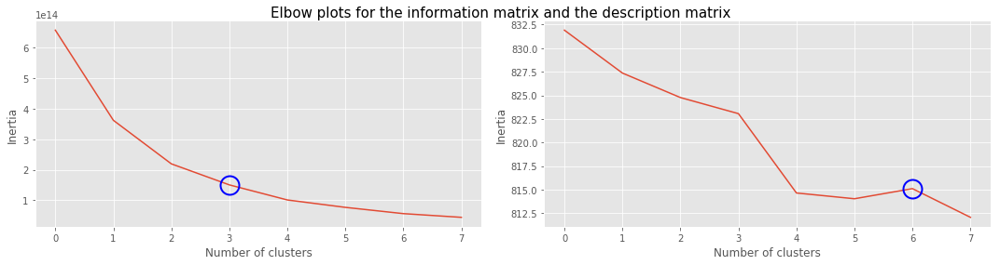

In [31]:
fig = plt.figure(figsize=(15, 4))

plt.subplot(1,2,1)
plt.plot(ssw1)
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.plot(3,ssw1[3],'o', ms = 20, mec = 'b', mfc = 'none', mew = 2)

plt.subplot(1,2,2)
plt.plot(ssw2)
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.plot(6,ssw2[6],'o', ms = 20, mec = 'b', mfc = 'none', mew = 2)

plt.tight_layout()
fig.suptitle('Elbow plots for the information matrix and the description matrix', fontsize= 15)
# 6 looks reasonable and compuntationally efficient

Given the number of clusters we can now compute the clustering on the matrices values.

In [32]:
labels_info = KMeans(n_clusters = 3, init = 'k-means++').fit(array1).labels_  # taking the labels of the clustered objects
labels_desc = KMeans(n_clusters = 6, init = 'k-means++').fit(array2).labels_

For every cluster we are going to need a dictionary that maps every cluster id to a list of the labels of the announcements in the matrix: $\{cluster_{i} : [1, 2, 6, \cdots], \cdots\}$

In [33]:
# creatng the dictionaries for both matrices = {0 (cluster id): [1 (ann_1), 2 (ann_2)....], ...}
clust_dic_info = {i:[] for i in range(3)} # creaing keys with empty list so we can append
for i,clust in enumerate(labels_info): # i = ann_id, clust = cluster_id
    clust_dic_info[clust].append(i) # appending to dic

clust_dic_desc = {i:[] for i in range(6)} # same here
for i,clust in enumerate(labels_desc):
    clust_dic_desc[clust].append(i)

We build a simple jaccard similarity function.

In [34]:
# defining jaccard function
def jaccard(array1,array2):
    return len(set.intersection(set(array1),set(array2)))/len(set.union(set(array1),set(array2)))

We now perform the following steps: 
- for every possible pair of clusters we compute the jaccard similarity.
- the first 3 couple of clusters are then returned and a nested list containing 3 lists (for every couple of clusters) of the announcements id of the clusters is created.
- finally, we have another nested list containing all the description of the announcements in the same couple of clusters.

In [35]:
similarities = {} # dictionaries with comparison between clusters and similarity score {0-1: 0.9, 0-2: 0.002, ...}
for clust_info in clust_dic_info: # searching in the clusters
    for clust_desc in clust_dic_desc:
        # computing scores bewteen all possible pairs
        similarities['{0}-{1}'.format(clust_info, clust_desc)] = jaccard(clust_dic_info[clust_info], clust_dic_desc[clust_desc])
for couple in similarities:
    print('Couple : {}, Similarity {}'.format(couple, similarities[couple]))

Couple : 0-0, Similarity 0.01606714628297362
Couple : 0-1, Similarity 0.0016814797021378813
Couple : 0-2, Similarity 0.006349586677848329
Couple : 0-3, Similarity 0.0016818837097549255
Couple : 0-4, Similarity 0.0016814797021378813
Couple : 0-5, Similarity 0.8139207402937034
Couple : 1-0, Similarity 0.010588235294117647
Couple : 1-1, Similarity 0.002531645569620253
Couple : 1-2, Similarity 0.01418877236273905
Couple : 1-3, Similarity 0.0018999366687777073
Couple : 1-4, Similarity 0.0031665611146295125
Couple : 1-5, Similarity 0.1548228548023756
Couple : 2-0, Similarity 0.0037593984962406013
Couple : 2-1, Similarity 0.007575757575757576
Couple : 2-2, Similarity 0.015789473684210527
Couple : 2-3, Similarity 0.0
Couple : 2-4, Similarity 0.0
Couple : 2-5, Similarity 0.011216299650133772


In [36]:
first_3 = sorted(similarities.values(), reverse = True)[:3] # sorting from highest to lowest and taking first 3
for_cloud = [] # creating list for cloud  [[ann_1,ann_3,ann_55][ann_2, ann_5,...][ann_90, ann_7,....]] nested list with 3 lists
for sim in first_3: 
    for key in similarities: # if the similarity is equal to a value in similarities..
        if similarities[key] == sim:
            for_cloud.append(list(clust_dic_info[int(key[0])] + clust_dic_desc[int(key[2])]))
            # append to the list the announcements that are in both the clusters

all_cloud = [] # [(first couple of clusters) [['a','b','c']['d','e','f']...], (second couple of clusters)[['k','j','k'], ['o'....]],...]
for list_ in for_cloud:
    clust_strings = []
    for ann in list_:
        clust_strings.append(desc_dic['ann_{}'.format(str(ann+1))]) # appending words from the desc_dic
    all_cloud.append(clust_strings)

final = [] # [['kajakakjaa','bella casa con bla bla...'],['ajjaakjak', ' sjsjhsjsjsj'],['sksjkjskkss', 'siosiso']]
for i in range(len(all_cloud)):
    final.append([' '.join(desc) for desc in all_cloud[i]])

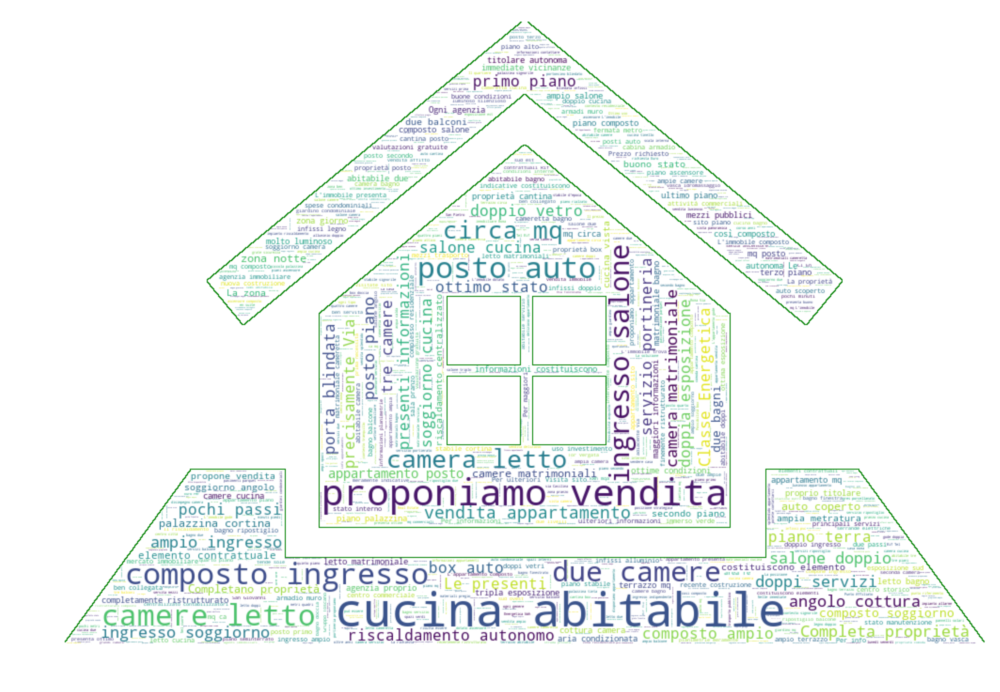

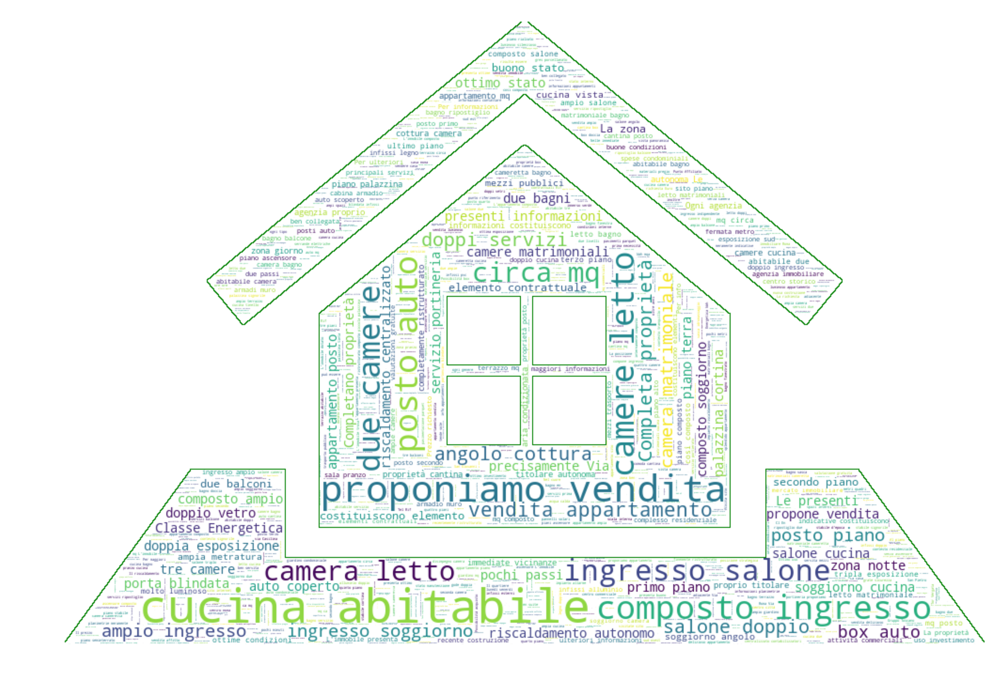

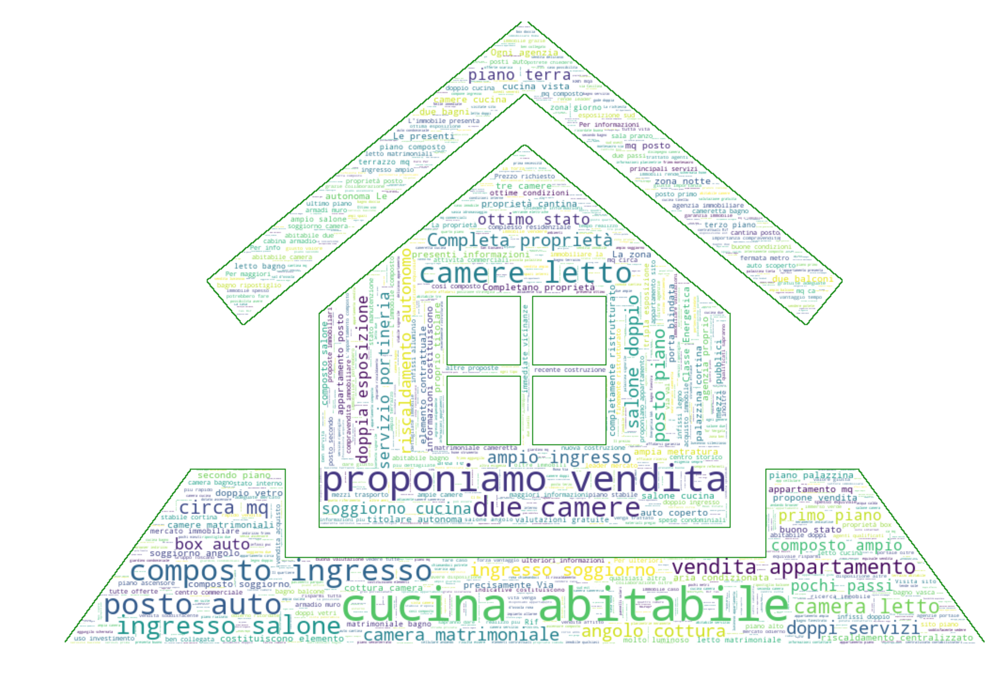

In [37]:
house_mask = np.array(Image.open("house.png")) # mask taken from the internet
for i in range(3):
    wordcloud = WordCloud(width=1600, height=800).generate(' '.join(final[i])) # generateing a word cloud (take only one string so we have to join)
    wc = WordCloud(background_color="white", max_words=100000,min_font_size = 1, max_font_size= 50,mask=house_mask, contour_width=0.1, contour_color='green')
    # generating the image with various settings
    wc.generate(' '.join(final[i])) # taking the input for the words to put in
    plt.figure(figsize=(13,6),dpi=600) # setting for size of figure
    plt.imshow(wc, interpolation='bilinear') # showing image 
    plt.axis("off") 
    plt.show()

## 2) Find the duplicates!

To hash the strings to a table, in order to speed up the process of searching and comparing through a large amount of strings. <br>
Our hash function is defined like this: <br>
- for every character we extract the ASCII order of it with the $ord$ function.
- we then square the number obtained this way.
- finally we sum the squared ASCII numbers.

To map the resulting hash value to the table we use the division method: we take the remainder of the value divided by the number of keys in the dictionary. The result is the key that is going to store the hashed value. <br>
The number of keys we chose is a very large prime number, so that the number of collisions is reduced.
The collisions are resolved via chaining method (the same hashed values are appended to a list). 

In [ ]:
table = {i:[] for i in range(33539825)} 

with open('passwords2.txt','r') as file:
    for field in file:
        hashed = sum(np.array(list(map(ord,field[:-2])))**2)
        table[hashed%33539825].append(field) #chaining method for discovering duplicates  
    file.close()

We can now find an estimate of the number of duplicates and collisions:
- we check if the list's length is larger than one, the length - 1 will be the number of duplicates.
- the collisions's amount is just the number of duplicates - $10^7$.

In [13]:
duplicates_counter = 0
for key in table:
    if table[key] != []:
        if len(table[key]) > 1:
            duplicates_counter += len(table[key]) - 1
print('duplicates found: {}'.format(duplicates_counter))
print('collisions found: {}'.format(duplicates_counter-10000000))

duplicates found: 109873085
collisions found: 99873085


If we have to take into account the order of the strings, the new function will be defined like this: <br>
- again, we take the order of every character of the string.
- this number is then turned into a string and joined with the other ones.
- the joined string is tunred then into an actual integer.


In [3]:
#128 max number of ascii, 20 max characters, 128**2 = 16384, 16384*20 = 327680, so i choose something like the half of it: 150000
table2 = {i:[] for i in range(33539825)} #idk random prime number, i guess?

with open('passwords2.txt','r') as file:
    for field in tqdm(file):
        hashed = int(''.join(str(ord(char)) for char in field))
        table2[hashed%33539825].append(field) #chaining method for discovering duplicates   

110000000it [13:56, 131479.40it/s]


The same method is used here.

In [4]:
duplicates_counter = 0
for key in tqdm(table2):
    if table2[key] != []:
        if len(table2[key]) > 1:
            duplicates_counter += len(table2[key]) - 1
print('duplicates found: {}'.format(duplicates_counter))
print('collisions found: {}'.format(duplicates_counter-10000000))

100%|█████████████████████████████████████████████████████████████████| 33539825/33539825 [00:12<00:00, 2728586.81it/s]


duplicates found: 108658407
collisions found: 98658407
